<a href="https://colab.research.google.com/github/Pranav-V-27/MGP_Beginners/blob/main/Notebooks/MGP_Beginners_Pranav_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning Practice and Undestanding

**Problem Statement:**  
<br>The target feature is Accident_severity which is a multi-class variable. The task is to classify this variable based on the other 31 features step-by-step by going through each day's task. Your metric for evaluation will be f1-score
**Target and Metrics:**    
<br>



## Import Data and Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
import itertools
%matplotlib inline


In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Colab_Files/RTA Dataset.csv')

In [ ]:
data.head()

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,Defect_of_vehicle,Area_accident_occured,Lanes_or_Medians,Road_allignment,Types_of_Junction,Road_surface_type,Road_surface_conditions,Light_conditions,Weather_conditions,Type_of_collision,Number_of_vehicles_involved,Number_of_casualties,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,No defect,Residential areas,NaN,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Collision with roadside-parked vehicles,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,No defect,Office areas,Undivided Two way,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,No defect,Recreational areas,other,NaN,No junction,Asphalt roads,Dry,Daylight,Normal,Collision with roadside objects,2,2,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,No defect,Office areas,other,Tangent road with mild grade and flat terrain,Y Shape,Earth roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,No defect,Industrial areas,other,Tangent road with flat terrain,Y Shape,Asphalt roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury


In [ ]:
data

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,Defect_of_vehicle,Area_accident_occured,Lanes_or_Medians,Road_allignment,Types_of_Junction,Road_surface_type,Road_surface_conditions,Light_conditions,Weather_conditions,Type_of_collision,Number_of_vehicles_involved,Number_of_casualties,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,No defect,Residential areas,NaN,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Collision with roadside-parked vehicles,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,No defect,Office areas,Undivided Two way,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,No defect,Recreational areas,other,NaN,No junction,Asphalt roads,Dry,Daylight,Normal,Collision with roadside objects,2,2,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,No defect,Office areas,other,Tangent road with mild grade and flat terrain,Y Shape,Earth roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,No defect,Industrial areas,other,Tangent road with flat terrain,Y Shape,Asphalt roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12311,16:15:00,Wednesday,31-50,Male,NaN,Employee,2-5yr,Lorry (11?40Q),Owner,NaN,No defect,Outside rural areas,Undivided Two way,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,1,Going straight,na,na,na,na,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
12312,18:00:00,Sunday,Unknown,Male,Elementary school,Employee,5-10yr,Automobile,Owner,NaN,No defect,Outside rural areas,Two-way (divided with broken lines road marking),Escarpments,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,1,Other,na,na,na,na,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
12313,13:55:00,Sunday,Over 51,Male,Junior high school,Employee,5-10yr,Bajaj,Owner,2-5yrs,No defect,Outside rural areas,Two-way (divided with broken lines road marking),Tangent road with mountainous terrain and,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,1,1,Other,Driver or rider,Male,31-50,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Serious Injury
12314,13:55:00,Sunday,18-30,Female,Junior high school,Employee,Above 10yr,Lorry (41?100Q),Owner,2-5yrs,No defect,Office areas,Undivided Two way,Tangent road with mountainous terrain and,No junction,Asphalt roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,1,Other,na,na,na,na,Driver,Normal,Not a Pedestrian,Driving under the influence of drugs,Slight Injury


In [ ]:
data.shape

(12316, 32)

In [ ]:
data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Time                         12316 non-null  object
 1   Day_of_week                  12316 non-null  object
 2   Age_band_of_driver           12316 non-null  object
 3   Sex_of_driver                12316 non-null  object
 4   Educational_level            11575 non-null  object
 5   Vehicle_driver_relation      11737 non-null  object
 6   Driving_experience           11487 non-null  object
 7   Type_of_vehicle              11366 non-null  object
 8   Owner_of_vehicle             11834 non-null  object
 9   Service_year_of_vehicle      8388 non-null   object
 10  Defect_of_vehicle            7889 non-null   object
 11  Area_accident_occured        12077 non-null  object
 12  Lanes_or_Medians             11931 non-null  object
 13  Road_allignment              12

In [ ]:
data.isnull().sum()

Time                              0
Day_of_week                       0
Age_band_of_driver                0
Sex_of_driver                     0
Educational_level               741
Vehicle_driver_relation         579
Driving_experience              829
Type_of_vehicle                 950
Owner_of_vehicle                482
Service_year_of_vehicle        3928
Defect_of_vehicle              4427
Area_accident_occured           239
Lanes_or_Medians                385
Road_allignment                 142
Types_of_Junction               887
Road_surface_type               172
Road_surface_conditions           0
Light_conditions                  0
Weather_conditions                0
Type_of_collision               155
Number_of_vehicles_involved       0
Number_of_casualties              0
Vehicle_movement                308
Casualty_class                    0
Sex_of_casualty                   0
Age_band_of_casualty              0
Casualty_severity                 0
Work_of_casuality           

<Axes: >

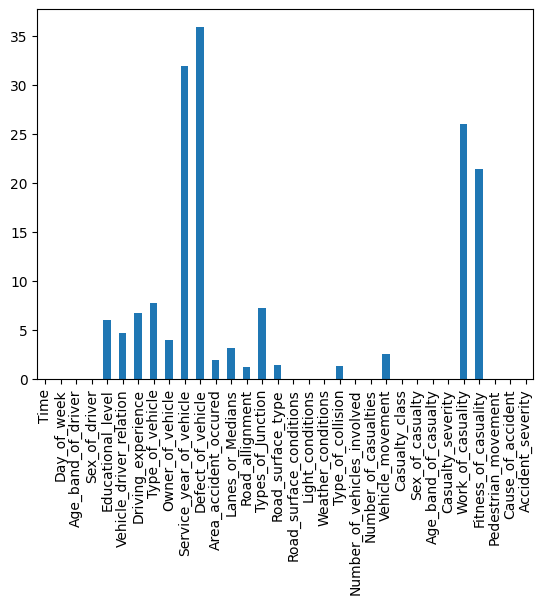

In [ ]:
round(data.isnull().sum() / data.shape[0] * 100.00,2).plot(kind = 'bar')

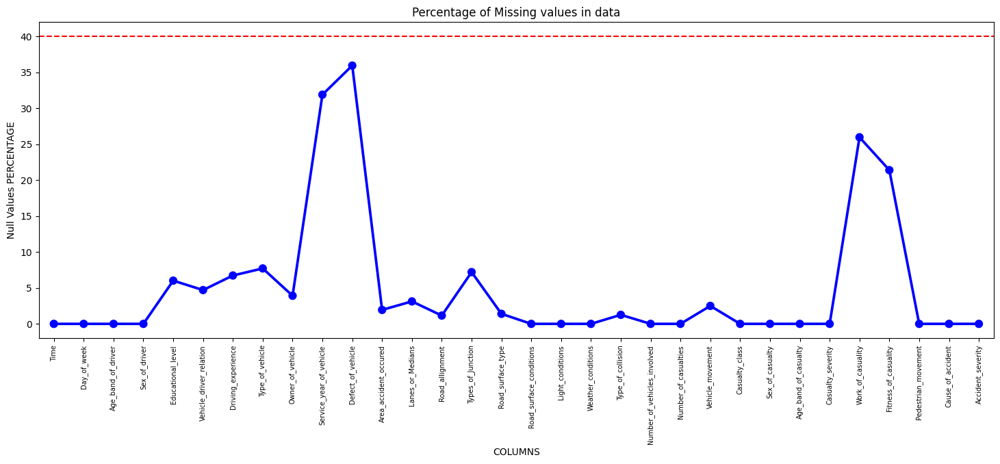

In [ ]:
null_data = pd.DataFrame((data.isnull().sum())*100/data.shape[0]).reset_index()
null_data.columns = ['Column Name', 'Null Values Percentage']
fig = plt.figure(figsize=(18,6))
ax = sns.pointplot(x="Column Name",y="Null Values Percentage",data=null_data,color='blue')
plt.xticks(rotation =90,fontsize =7)
ax.axhline(40, ls='--',color='red')
plt.title("Percentage of Missing values in data")
plt.ylabel("Null Values PERCENTAGE")
plt.xlabel("COLUMNS")
plt.show()

###EDA With Profiling

In [ ]:
%%capture
!pip install pandas-profiling



In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
# Create a ProfileReport object
profile = ProfileReport(data)

# Generate the EDA report and display it in a Jupyter Notebook
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file("eda_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

###EDA With Autoviz

In [ ]:
%%capture
!pip install autoviz

  Attempting uninstall: holoviews
    Found existing installation: holoviews 1.17.1
    Uninstalling holoviews-1.17.1:
      Successfully uninstalled holoviews-1.17.1


In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()
#dft = AV.AutoViz(data)

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [ ]:
# Install AutoViz if you haven't already
#!pip install autoviz

# Import AutoViz
#from autoviz.AutoViz_Class import AutoViz_Class


AV = AutoViz_Class()

# Specify the file path and name correctly
# You can use an absolute path or a relative path from your script's location
file_path = "/content/drive/MyDrive/Colab_Files/RTA Dataset.csv"

# Specify the target variable
target_variable = "Accident_severity"

# Perform EDA with AutoViz
report = AV.AutoViz(
    filename= file_path,   # Use the correct file path
    sep=",",
    #depVar=target_variable,
    dfte=None,
    header=0,
    verbose=2,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None
    )




Shape of your Data Set loaded: (12316, 32)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing upto 30 columns max in each category:
    Numeric Columns : []
    Integer-Categorical Columns: ['Number_of_vehicles_involved', 'Number_of_casualties']
    String-Categorical Columns: ['Day_of_week', 'Age_band_of_driver', 'Sex_of_driver', 'Educational_level', 'Vehicle_driver_relation', 'Driving_experience', 'Type_of_vehicle', 'Owner_of_vehicle', 'Service_year_of_vehicle', 'Defect_of_vehicle', 'Area_accident_occured', 'Lanes_or_Medians', 'Types_of_Junction', 'Road_surface_type', 'Road_surface_conditions', 'Light_conditions', 'Weather_conditions', 'Type_of_collision', 'Vehicle_movement', 'Casualty_class', 'Sex_of_casualty', 'Age_band_of_ca

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Time,object,0.000000,8,nan,nan,"1074 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 1074 unique values: Use hash encoding or embedding to reduce dimension."
Day_of_week,object,0.000000,0,nan,nan,No issue
Age_band_of_driver,object,0.000000,0,nan,nan,No issue
Sex_of_driver,object,0.000000,0,nan,nan,No issue
Educational_level,object,6.016564,0,nan,nan,"741 missing values. Impute them with mean, median, mode, or a constant value such as 123., 2 rare categories: ['Unknown', 'Illiterate']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Vehicle_driver_relation,object,4.701202,0,nan,nan,"579 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Driving_experience,object,6.731082,0,nan,nan,"829 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Type_of_vehicle,object,7.713543,0,nan,nan,"950 missing values. Impute them with mean, median, mode, or a constant value such as 123., 5 rare categories: ['Special vehicle', 'Ridden horse', 'Turbo', 'Bajaj', 'Bicycle']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Owner_of_vehicle,object,3.913608,0,nan,nan,"482 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Other']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Service_year_of_vehicle,object,31.893472,0,nan,nan,"3928 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"


Number of All Scatter Plots = 3


[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

Could not draw wordcloud plot for Time
All Plots are saved in ./AutoViz_Plots/AutoViz
Time to run AutoViz = 54 seconds 


In [ ]:
import IPython
IPython.display.HTML('/content/AutoViz_Plots/AutoViz/Violin_Plots_1_.svg')

##EDA with dabl

In [ ]:
!pip install dabl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 564.3/564.3 kB 7.8 MB/s eta 0:00:00


In [ ]:
import dabl
import pandas as pd

data = pd.read_csv("/content/drive/MyDrive/Colab_Files/RTA Dataset.csv" )
dabl.plot(data,"Accident_severity")

Target looks like classification
Showing only top 10 of 31 categorical features


[<Axes: title={'center': 'Target distribution'}, xlabel='count', ylabel='Accident_severity'>,
 [array([[<Axes: xlabel='Number_of_casualties', ylabel='Number_of_casualties'>]],
        dtype=object)],
 array([[<Axes: title={'center': 'Number_of_vehicles_involved'}>,
         <Axes: title={'center': 'Types_of_Junction'}>,
         <Axes: title={'center': 'Age_band_of_driver'}>,
         <Axes: title={'center': 'Weather_conditions'}>,
         <Axes: title={'center': 'Type_of_vehicle'}>],
        [<Axes: title={'center': 'Area_accident_occured'}>,
         <Axes: title={'center': 'Cause_of_accident'}>,
         <Axes: title={'center': 'Day_of_week'}>,
         <Axes: title={'center': 'Light_conditions'}>,
         <Axes: title={'center': 'Type_of_collision'}>]], dtype=object)]

In [ ]:
# converting 'time' to datetime
data['Time'] = pd.to_datetime(data['Time'])

# date (day-month-year) time
data["Time"].dt.hour

# extracting hour and minute from timestamp
data['hour'] = data['Time'].dt.hour
data['minute'] = data['Time'].dt.minute
data.drop('Time', axis=1, inplace=True)

In [ ]:
data.columns

Index(['Day_of_week', 'Age_band_of_driver', 'Sex_of_driver', 'Educational_level', 'Vehicle_driver_relation', 'Driving_experience', 'Type_of_vehicle', 'Owner_of_vehicle', 'Service_year_of_vehicle', 'Defect_of_vehicle', 'Area_accident_occured', 'Lanes_or_Medians', 'Road_allignment', 'Types_of_Junction', 'Road_surface_type', 'Road_surface_conditions', 'Light_conditions', 'Weather_conditions', 'Type_of_collision', 'Number_of_vehicles_involved', 'Number_of_casualties', 'Vehicle_movement', 'Casualty_class', 'Sex_of_casualty', 'Age_band_of_casualty', 'Casualty_severity', 'Work_of_casuality', 'Fitness_of_casuality', 'Pedestrian_movement', 'Cause_of_accident', 'Accident_severity', 'hour', 'minute'], dtype='object')

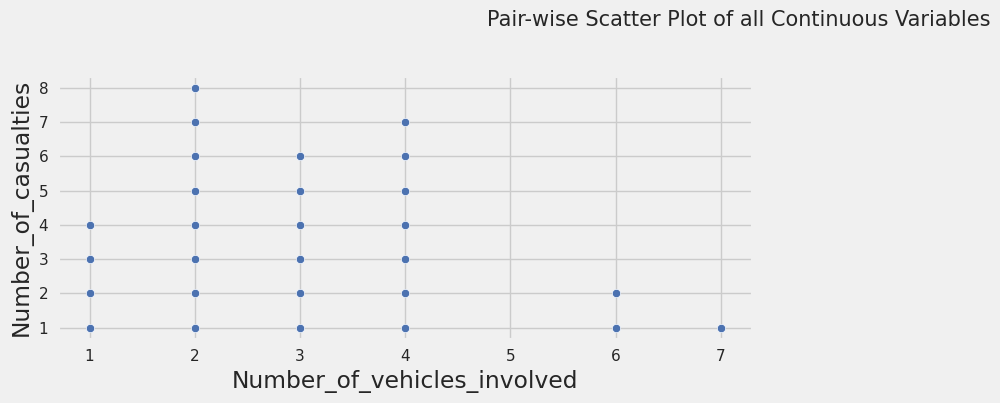

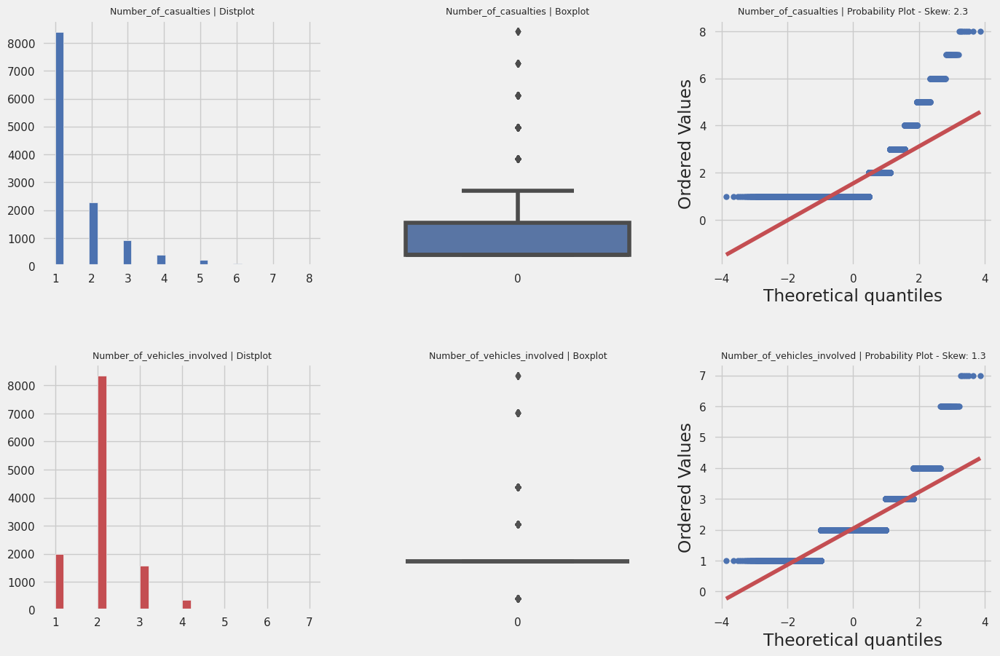

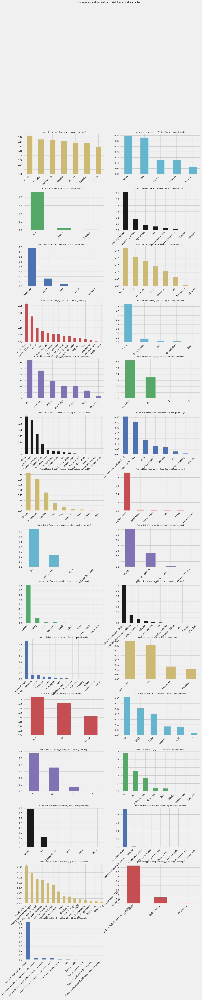

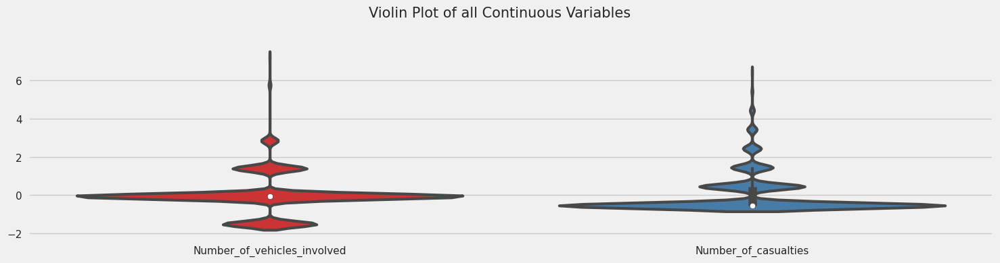

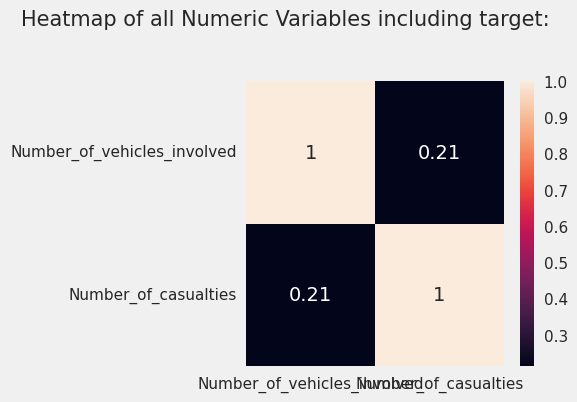

...

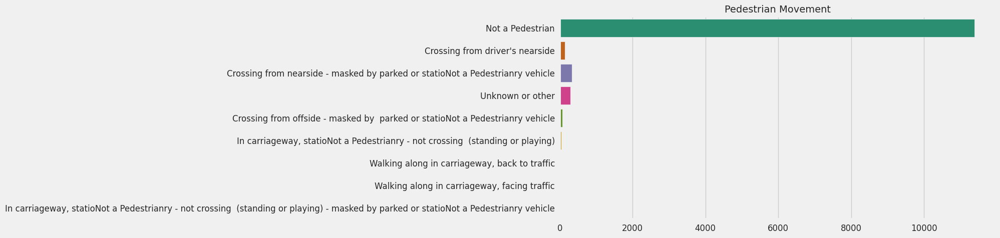

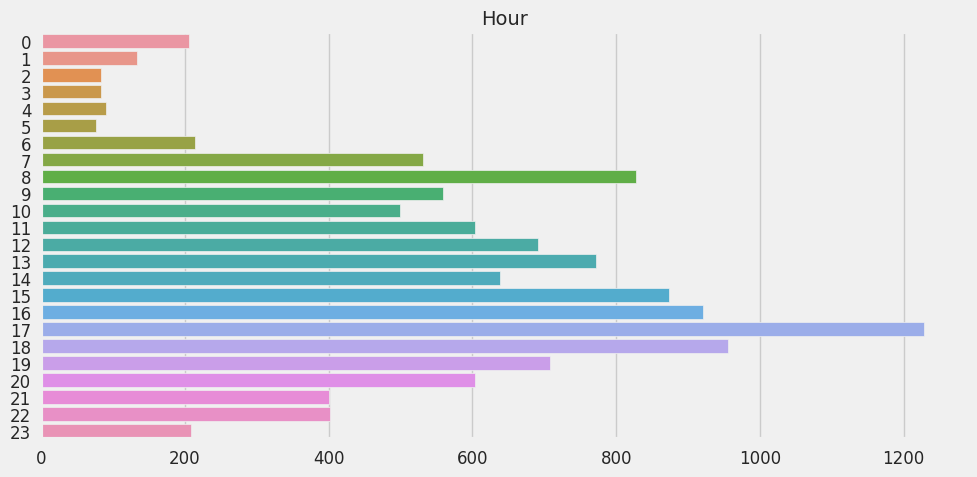

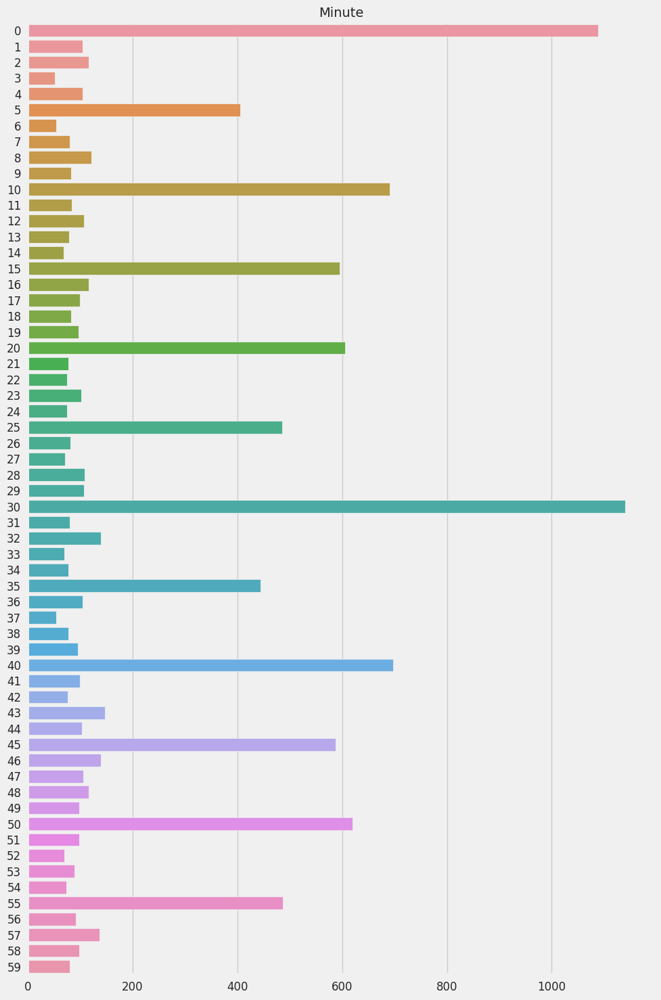

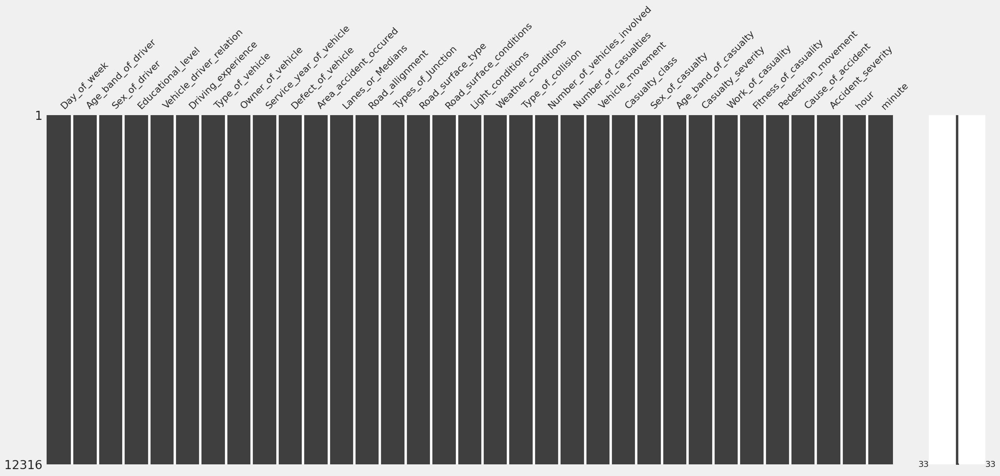

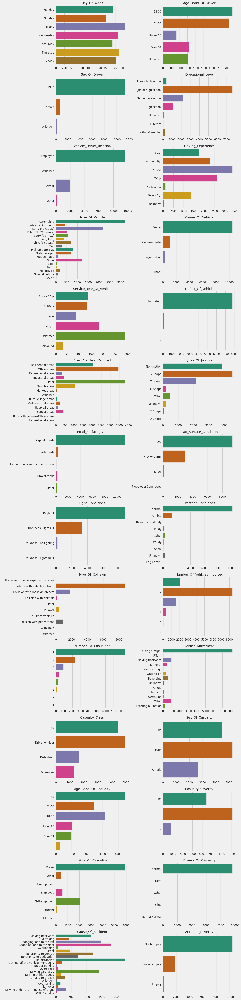

In [62]:
plt.figure(figsize=(15,70))
plotnumber = 1

for col in data.drop(['hour', 'minute', 'Lanes_or_Medians', 'Road_allignment', 'Pedestrian_movement'], axis=1):
    if plotnumber <= data.shape[1]:
        ax1 = plt.subplot(16,2,plotnumber)
        sns.countplot(data=data, y=col, palette='Dark2')
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        plt.title(col.title(), fontsize=14)
        plt.xlabel('')
        plt.ylabel('')
    plotnumber +=1
plt.tight_layout()

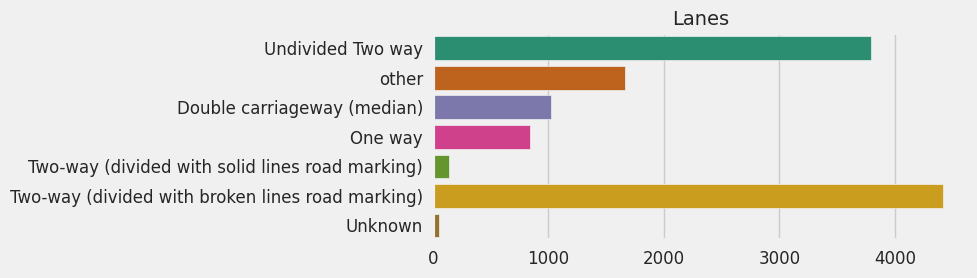

In [63]:
plt.figure(figsize=(10,3))
sns.countplot(data=data, y='Lanes_or_Medians', palette = 'Dark2')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lanes', fontsize=14)
plt.xlabel('')
plt.ylabel('')
plt.tight_layout()

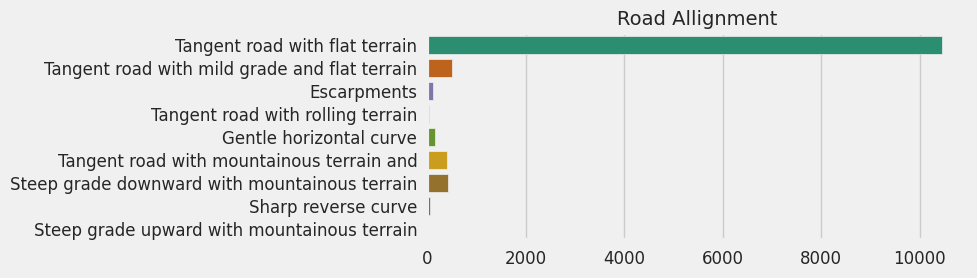

In [64]:
plt.figure(figsize=(10,3))
sns.countplot(data=data, y='Road_allignment', palette = 'Dark2')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Road Allignment', fontsize=14)
plt.xlabel('')
plt.ylabel('')
plt.tight_layout()

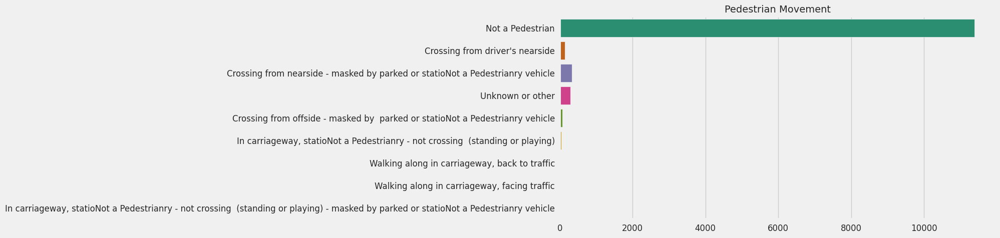

In [65]:
plt.figure(figsize=(10,5))
sns.countplot(data=data, y='Pedestrian_movement', palette = 'Dark2')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Pedestrian Movement', fontsize=14)
plt.xlabel('')
plt.ylabel('')
plt.tight_layout()

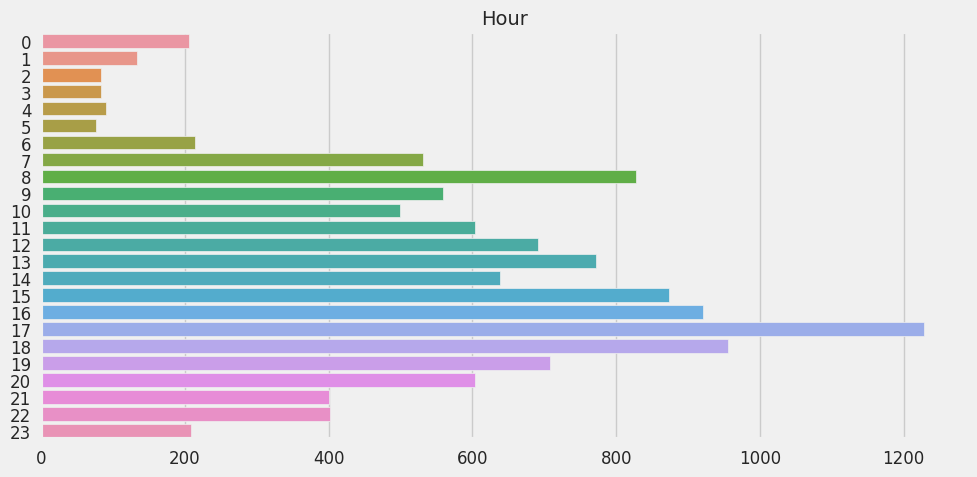

In [66]:
plt.figure(figsize=(10,5))
sns.countplot(data=data, y='hour')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Hour', fontsize=14)
plt.xlabel('')
plt.ylabel('')
plt.tight_layout()

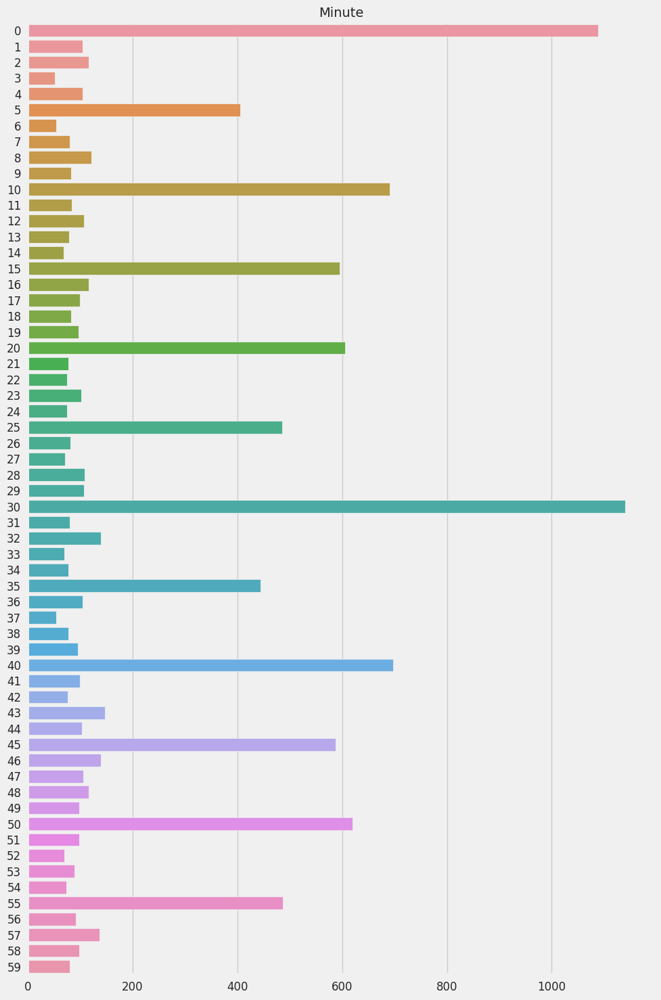

In [67]:
plt.figure(figsize=(10,15))
sns.countplot(data=data, y='minute')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Minute', fontsize=14)
plt.xlabel('')
plt.ylabel('')
plt.tight_layout()

## Data Preprocessing



In [ ]:
data.isna().sum()

Day_of_week                       0
Age_band_of_driver                0
Sex_of_driver                     0
Educational_level               741
Vehicle_driver_relation         579
Driving_experience              829
Type_of_vehicle                 950
Owner_of_vehicle                482
Service_year_of_vehicle        3928
Defect_of_vehicle              4427
Area_accident_occured           239
Lanes_or_Medians                385
Road_allignment                 142
Types_of_Junction               887
Road_surface_type               172
Road_surface_conditions           0
Light_conditions                  0
Weather_conditions                0
Type_of_collision               155
Number_of_vehicles_involved       0
Number_of_casualties              0
Vehicle_movement                308
Casualty_class                    0
Sex_of_casualty                   0
Age_band_of_casualty              0
Casualty_severity                 0
Work_of_casuality              3198
Fitness_of_casuality        

different methods and strategy to handle missing values

Method 1 with most_frequent

In [ ]:
from sklearn.impute import SimpleImputer
SI = SimpleImputer(strategy="most_frequent")
imputed_data = pd.DataFrame(SI.fit_transform(data))

imputed_data.columns = data.columns
imputed_data.isna().sum()

Day_of_week                    0
Age_band_of_driver             0
Sex_of_driver                  0
Educational_level              0
Vehicle_driver_relation        0
Driving_experience             0
Type_of_vehicle                0
Owner_of_vehicle               0
Service_year_of_vehicle        0
Defect_of_vehicle              0
Area_accident_occured          0
Lanes_or_Medians               0
Road_allignment                0
Types_of_Junction              0
Road_surface_type              0
Road_surface_conditions        0
Light_conditions               0
Weather_conditions             0
Type_of_collision              0
Number_of_vehicles_involved    0
Number_of_casualties           0
Vehicle_movement               0
Casualty_class                 0
Sex_of_casualty                0
Age_band_of_casualty           0
Casualty_severity              0
Work_of_casuality              0
Fitness_of_casuality           0
Pedestrian_movement            0
Cause_of_accident              0
Accident_s

In [ ]:
imputed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Day_of_week                  12316 non-null  object
 1   Age_band_of_driver           12316 non-null  object
 2   Sex_of_driver                12316 non-null  object
 3   Educational_level            12316 non-null  object
 4   Vehicle_driver_relation      12316 non-null  object
 5   Driving_experience           12316 non-null  object
 6   Type_of_vehicle              12316 non-null  object
 7   Owner_of_vehicle             12316 non-null  object
 8   Service_year_of_vehicle      12316 non-null  object
 9   Defect_of_vehicle            12316 non-null  object
 10  Area_accident_occured        12316 non-null  object
 11  Lanes_or_Medians             12316 non-null  object
 12  Road_allignment              12316 non-null  object
 13  Types_of_Junction            12

In [ ]:
import missingno as msno

In [ ]:
msno.matrix(imputed_data.sort_values('Accident_severity'))

<Axes: >

In [ ]:
#LabelEncoder for categorical values
from sklearn.preprocessing import LabelEncoder


In [87]:
imputed_data_1 = imputed_data.copy()

In [ ]:
imputed_data_1.shape

(12316, 33)

In [ ]:
cols_to_encode = imputed_data_1.select_dtypes(include=['object']).columns

In [ ]:
cols_to_encode = cols_to_encode.drop('Accident_severity')

In [86]:
le = LabelEncoder()
for col in cols_to_encode:
    imputed_data_1[col] = le.fit_transform(imputed_data_1[col])

In [99]:
def encode(column, data, value):
  le = LabelEncoder()
  le.fit(data[column])
  return le.transform([value])[0]

In [105]:
def predict(data, model):
  return model.predict(data)[0]

0         Slight Injury
1         Slight Injury
2        Serious Injury
3         Slight Injury
4         Slight Injury
              ...      
12311     Slight Injury
12312     Slight Injury
12313    Serious Injury
12314     Slight Injury
12315     Slight Injury
Name: Accident_severity, Length: 12316, dtype: object

In [104]:
predict(X.iloc[9:10], best_etc_model)

array([1])

In [91]:
data.iloc[:,7]

0               Owner
1               Owner
2               Owner
3        Governmental
4               Owner
             ...     
12311           Owner
12312           Owner
12313           Owner
12314           Owner
12315           Owner
Name: Owner_of_vehicle, Length: 12316, dtype: object

In [100]:
encode("Owner_of_vehicle", data, data.iloc[8,7])

3

In [ ]:
imputed_data_1.head()

,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,Defect_of_vehicle,Area_accident_occured,Lanes_or_Medians,Road_allignment,Types_of_Junction,Road_surface_type,Road_surface_conditions,Light_conditions,Weather_conditions,Type_of_collision,Number_of_vehicles_involved,Number_of_casualties,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity,hour,minute
0,1,0,1,0,0,0,0,3,3,2,9,2,5,1,0,0,3,2,3,1,1,2,3,2,5,3,0,2,5,9,Slight Injury,17,2
1,1,1,1,4,0,3,11,3,2,2,6,4,5,1,0,0,3,2,8,1,1,2,3,2,5,3,0,2,5,16,Slight Injury,17,2
2,1,0,1,4,0,0,5,3,5,2,1,6,5,1,0,0,3,2,2,1,1,2,0,1,1,2,0,2,5,0,Serious Injury,17,2
3,3,0,1,4,0,2,11,0,5,2,6,6,6,7,2,0,0,2,8,1,1,2,2,0,0,2,0,2,5,1,Slight Injury,1,6
4,3,0,1,4,0,1,0,3,2,2,4,6,5,7,0,0,0,2,8,1,1,2,3,2,5,3,0,2,5,16,Slight Injury,1,6


In [ ]:
imputed_data_1.shape

(12316, 33)

In [69]:
import joblib
joblib.dump(le, "encoder.joblib")

['encoder.joblib']

In [74]:
print(list(cols_to_encode))

['Day_of_week', 'Age_band_of_driver', 'Sex_of_driver', 'Educational_level', 'Vehicle_driver_relation', 'Driving_experience', 'Type_of_vehicle', 'Owner_of_vehicle', 'Service_year_of_vehicle', 'Defect_of_vehicle', 'Area_accident_occured', 'Lanes_or_Medians', 'Road_allignment', 'Types_of_Junction', 'Road_surface_type', 'Road_surface_conditions', 'Light_conditions', 'Weather_conditions', 'Type_of_collision', 'Number_of_vehicles_involved', 'Number_of_casualties', 'Vehicle_movement', 'Casualty_class', 'Sex_of_casualty', 'Age_band_of_casualty', 'Casualty_severity', 'Work_of_casuality', 'Fitness_of_casuality', 'Pedestrian_movement', 'Cause_of_accident', 'hour', 'minute']


In [ ]:
#Split Training Data
from sklearn.model_selection import train_test_split

In [ ]:
X = imputed_data_1.drop("Accident_severity", axis = 1)
y = imputed_data_1["Accident_severity"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((8621, 32), (3695, 32), (8621,), (3695,))

In [ ]:
#Using SMOTE Upsampling for Imbalance Target Feature
from collections import Counter

In [ ]:
counter = Counter(y_train)

for k, v in counter.items():
    per = 100*v/len(y_train)
    print(f"Class = {k}, n={v} ({per:.2f}%)")

Class = Slight Injury, n=7324 (84.96%)
Class = Serious Injury, n=1191 (13.82%)
Class = Fatal injury, n=106 (1.23%)


In [ ]:
# Synthetic Minority Over-sampling Technique

from imblearn.over_sampling import SMOTE

In [ ]:
oversample = SMOTE()
X_train, y_train = oversample.fit_resample(X_train, y_train)

In [ ]:
counter = Counter(y_train)

for k, v in counter.items():
    per = 100*v/len(y_train)
    print(f"Class = {k}, n={v} ({per:.2f}%)")

Class = Slight Injury, n=7324 (33.33%)
Class = Serious Injury, n=7324 (33.33%)
Class = Fatal injury, n=7324 (33.33%)


In [ ]:
#Training Model
y_test = le.fit_transform(y_test)
y_train = le.fit_transform(y_train)

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier

In [ ]:
models = {'XGB': XGBClassifier(),
          'RFC': RandomForestClassifier(n_estimators=200),
          'ETC': ExtraTreesClassifier()}

fitted_models = {}

for model_name, model in models.items():
    model.fit(X_train, y_train.reshape(-1))
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Save the fitted model to the fitted_models dictionary
    fitted_models[model_name] = model
    print(f"{model_name} Accuracy: {accuracy}")
    print(f"{model_name} Precision: {precision}")
    print(f"{model_name} Recall: {recall}")
    print(f"{model_name} F1 Score: {f1}\n")

XGB Accuracy: 0.8078484438430311
XGB Precision: 0.7662025463416627
XGB Recall: 0.8078484438430311
XGB F1 Score: 0.7810178370060206

RFC Accuracy: 0.7972936400541272
RFC Precision: 0.7542687213081766
RFC Recall: 0.7972936400541272
RFC F1 Score: 0.7710015083323094

ETC Accuracy: 0.8100135317997293
ETC Precision: 0.7525748998786704
ETC Recall: 0.8100135317997293
ETC F1 Score: 0.77024638017336



In [ ]:
#Hyperparameter Tuning
# Hyperparameter tuning using Grid Search Cross-Validation

from sklearn.model_selection import GridSearchCV

In [ ]:
fitted_models['ETC'].get_params()

{'bootstrap': False,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [ ]:
# Define the parameter grid for ExtraTreesClassifier
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 30],
    'min_samples_split': [2, 10],
    'min_samples_leaf': [1, 4]
}

In [ ]:
#Create the GridSearchCV object
grid_search = GridSearchCV(estimator=fitted_models['ETC'], param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)

# Get the best model found by GridSearchCV
best_etc_model = grid_search.best_estimator_

Fitting 5 folds for each of 36 candidates, totalling 180 fits


In [ ]:
 # Print the best parameters found
print("Best parameters:", grid_search.best_params_)
print('Best index:', grid_search.best_index_)
print('Best score:', grid_search.best_score_)

Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best index: 2
Best score: 0.9534440541787514


In [68]:
import joblib
joblib.dump(best_etc_model, "Extra_Trees_Clf.joblib")

['Extra_Trees_Clf.joblib']

In [81]:
data.iloc[7,6]

'Automobile'

In [85]:
le.fit_transform(data.iloc[:,6])

array([ 0, 11,  5, ...,  1,  5,  7])